# KITTI Object Point Clouds

In [2]:
import os
import numpy as np
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt

In [3]:
# Go through all the labels.
# Get list of all labels
# Then find one frame for each label
# For each of these frames
    # Make a scatter plot with just the points inside the bboxes

In [4]:
object_count = dict()

In [5]:
DATA_DIR_ROOT = '../../../kitti/training/'

In [6]:
def count_labels(label_path):
    with open(label_path, 'r') as file:
        for line in file:
            parts = line.strip().split()
            if parts[0] in object_count.keys():
                object_count[parts[0]] += 1
            else:
                object_count[parts[0]] = 1

In [7]:
# Go into the ARCS data folder
labels_dir_path = Path(DATA_DIR_ROOT, 'label_2')
# For each .txt file
for label_file in labels_dir_path.iterdir():
    if str(label_file).endswith('.txt'):
        # For each label in the file
        labels = count_labels(label_file)

In [8]:
print(object_count)

{'Car': 28742, 'Van': 2914, 'Pedestrian': 4487, 'Misc': 973, 'DontCare': 11295, 'Cyclist': 1627, 'Truck': 1094, 'Tram': 511, 'Person_sitting': 222}


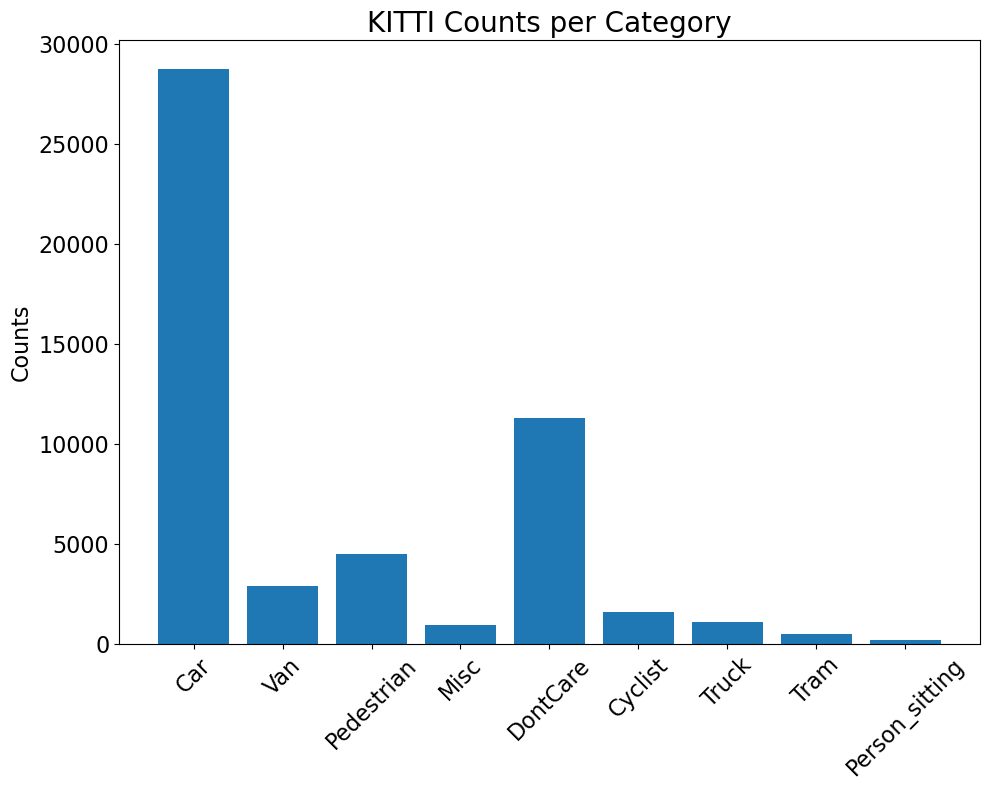

In [32]:
# Unpack keys and values
labels = list(object_count.keys())
counts = list(object_count.values())


# Create the bar chart
plt.figure(figsize=(10, 8))
plt.bar(labels, counts)
# plt.xlabel('Vehicle Type', fontsize=fontsize + 6)
plt.ylabel('Counts', fontsize=16)
plt.title('KITTI Counts per Category', fontsize=20)
plt.xticks(rotation=45, fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()

plt.savefig('kitti_label_distribution.png', dpi=300)

plt.show()

In [429]:
def file_contains(label_path, label):
    with open(label_path, 'r') as file:
        for line in file:
            parts = line.strip().split()
            # print(parts[0], end=' ')
            if parts[0] == label:
                return True
    return False

In [430]:
# Get label file with label
def get_file_with_label(label):
    # print('there')
    for label_file in labels_dir_path.iterdir():
        if str(label_file).endswith('.txt'):
            # For each label in the file
            if file_contains(label_file, label):
                return label_file

In [431]:
def set_axes_equal(ax):
    """Make axes of 3D plot have equal scale so that spheres appear as spheres, cubes as cubes, etc."""
    x_limits = ax.get_xlim3d()
    y_limits = ax.get_ylim3d()
    z_limits = ax.get_zlim3d()

    x_range = abs(x_limits[1] - x_limits[0])
    x_middle = np.mean(x_limits)
    y_range = abs(y_limits[1] - y_limits[0])
    y_middle = np.mean(y_limits)
    z_range = abs(z_limits[1] - z_limits[0])
    z_middle = np.mean(z_limits)

    box_size = max([x_range, y_range, z_range]) / 2.0

    ax.set_xlim3d([x_middle - box_size, x_middle + box_size])
    ax.set_ylim3d([y_middle - box_size, y_middle + box_size])
    ax.set_zlim3d([z_middle - box_size, z_middle + box_size])

In [432]:
# Function to plot the bounding box
def plot_bbox(ax, bbox):
    # Bounding box order that displays pointpillars predictions correctly   
    dz, dx, dy, y, z, x, yaw = bbox
    y = -y
    z = -z
    yaw = -yaw

    
    corners = np.array([
        [x - dx/2, y - dy/2, z - dz/2],
        [x + dx/2, y - dy/2, z - dz/2],
        [x + dx/2, y + dy/2, z - dz/2],
        [x - dx/2, y + dy/2, z - dz/2],
        [x - dx/2, y - dy/2, z + dz/2],
        [x + dx/2, y - dy/2, z + dz/2],
        [x + dx/2, y + dy/2, z + dz/2],
        [x - dx/2, y + dy/2, z + dz/2]
    ])
    

    # Rotate corners around the Z-axis (around their centers)
    rotation_matrix = np.array([
        [np.cos(yaw), -np.sin(yaw), 0],
        [np.sin(yaw),  np.cos(yaw), 0],
        [0,            0,           1]
    ])

    # # Adjust the corners to be about the origin for rotation, then add the [x, y, z] back after rotation
    corners = corners - np.array([x, y, z])
    corners = np.dot(corners, rotation_matrix.T)
    corners += np.array([x, y, z])
    
    # Define the edges of the bounding box
    edges = [
        (0, 1), (1, 2), (2, 3), (3, 0),
        (4, 5), (5, 6), (6, 7), (7, 4),
        (0, 4), (1, 5), (2, 6), (3, 7)
    ]
    # Plot the edges
    for edge in edges:
        ax.plot3D(*zip(corners[edge[0]], corners[edge[1]]), color='r', linewidth=1)

In [433]:
def read_kitti_labels(label_path):
    bboxes = []
    with open(label_path, 'r') as file:
        for line in file:
            parts = line.strip().split()
            if parts[0] != 'DontCare':
                bbox = [float(value) for value in parts[8:15]]  # Extract the bounding box dimensions and location
                bboxes.append(bbox)
    return np.array(bboxes)

In [434]:
def read_specific_kitti_labels(label_path, label):
    # Just return the bbox of the given label
    with open(label_path, 'r') as file:
        for line in file:
            parts = line.strip().split()
            if parts[0] == label:
                return [float(value) for value in parts[8:15]]

In [496]:
def plot_label(label, bin_points, label_bbox):
    # Set up the plot
    fig = plt.figure(figsize=(60, 60))
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot the point cloud
    ax.scatter(bin_points[:, 0], bin_points[:, 1], bin_points[:, 2], s=.05, c=bin_points[:, 3], cmap='viridis', marker=',')
    # ax.scatter(bin_points[0], bin_points[1], bin_points[2], s=10, c=bin_points[3], cmap='viridis', marker=',')
    
    # Plot each bounding box only if the score is above the threshold
    plot_bbox(ax, label_bbox)
    
    # Setting the axes properties
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    
    # Adjust the view angle if needed
    ax.view_init(elev=90, azim=210) # You can change these angles to get a better view
    
    # Fix aspect ratio
    set_axes_equal(ax)
    
    plt.show()
    
    # Save the figure
    fig.savefig(f'kitti_label_{label}_points.png', dpi=300)

In [436]:
# def point_is_in_an_roi_box(point, bbox):
#     # print(point, end=' ')
#     # Extract the point coordinates
#     x, y, z = point
    
#     # Extract the box parameters
#     dz, dx, dy, cy, cz, cx, yaw = bbox
#     cy = -cy
#     yaw = -yaw        
    
    
#     # Create the rotation matrix for the yaw angle
#     cos_yaw = np.cos(-yaw)  # Negative for the inverse rotation
#     sin_yaw = np.sin(-yaw)
    
#     rotation_matrix = np.array([
#         [cos_yaw, -sin_yaw, 0],
#         [sin_yaw,  cos_yaw, 0],
#         [0,       0,       1]
#     ])
    
#     # Translate the point to the box's coordinate frame
#     translated_point = np.array([x - cx, y - cy, z - cz])
    
#     # Rotate the point to align with the box
#     rotated_point = rotation_matrix.dot(translated_point)
    
#     # Check if the point is within the box dimensions
#     half_lengths = [dz / 2, dy / 2, dx / 2]
#     in_box = all([
#         -half_lengths[i] <= rotated_point[i] <= half_lengths[i] for i in range(3)
#     ])

#     if in_box:
#         return True
    
#     return False

In [477]:
# def point_is_in_an_roi_box_bev(point, bbox):
#     # Extract the point coordinates - we only need x and y for BEV
#     x, y, _ = point
    
#     # Extract the box parameters
#     dz, dx, dy, cy, cz, cx, yaw = bbox
#     cy = -cy
#     # yaw = -yaw  
    
#     # Create the rotation matrix for the yaw angle (2D rotation for BEV)
#     cos_yaw = np.cos(-yaw)  # Negative for the inverse rotation
#     sin_yaw = np.sin(-yaw)
    
#     # For BEV, we only need 2D rotation
#     rotation_matrix = np.array([
#         [cos_yaw, -sin_yaw],
#         [sin_yaw,  cos_yaw]
#     ])
    
#     # Translate the point to the box's coordinate frame (2D only)
#     translated_point = np.array([x - cx, y - cy])
    
#     # Rotate the point to align with the box
#     rotated_point = rotation_matrix.dot(translated_point)
    
#     # Check if the point is within the box dimensions (only x and y)
#     half_lengths = [dy / 2, dx / 2]  # Only checking y and x dimensions
#     in_box = all([
#         -half_lengths[i] <= rotated_point[i] <= half_lengths[i] for i in range(2)
#     ])
    
#     return in_box

In [479]:
# def roi_filter_points(input_file, bbox):
#     # Get dataframe from input file
#     input_df = pd.DataFrame(input_file)
    
#     # Initialize a list to store rows that meet the criteria
#     filtered_data = []

#     # Iterate through each row in the input DataFrame
#     for index, row in input_df.iterrows():
#     # for index, row in input_df.iloc[:3].iterrows():
#         point = (row.iloc[0], row.iloc[1], row.iloc[2])
#         # Check if the point is inside any of the ROI boxes
#         if point_is_in_an_roi_box_bev(point, bbox):
#             filtered_data.append(row)
        

#     # Create a DataFrame from the filtered data
#     filtered_df = pd.DataFrame(filtered_data)
#     return filtered_df

Car
..\..\..\kitti\training\label_2\003206.txt


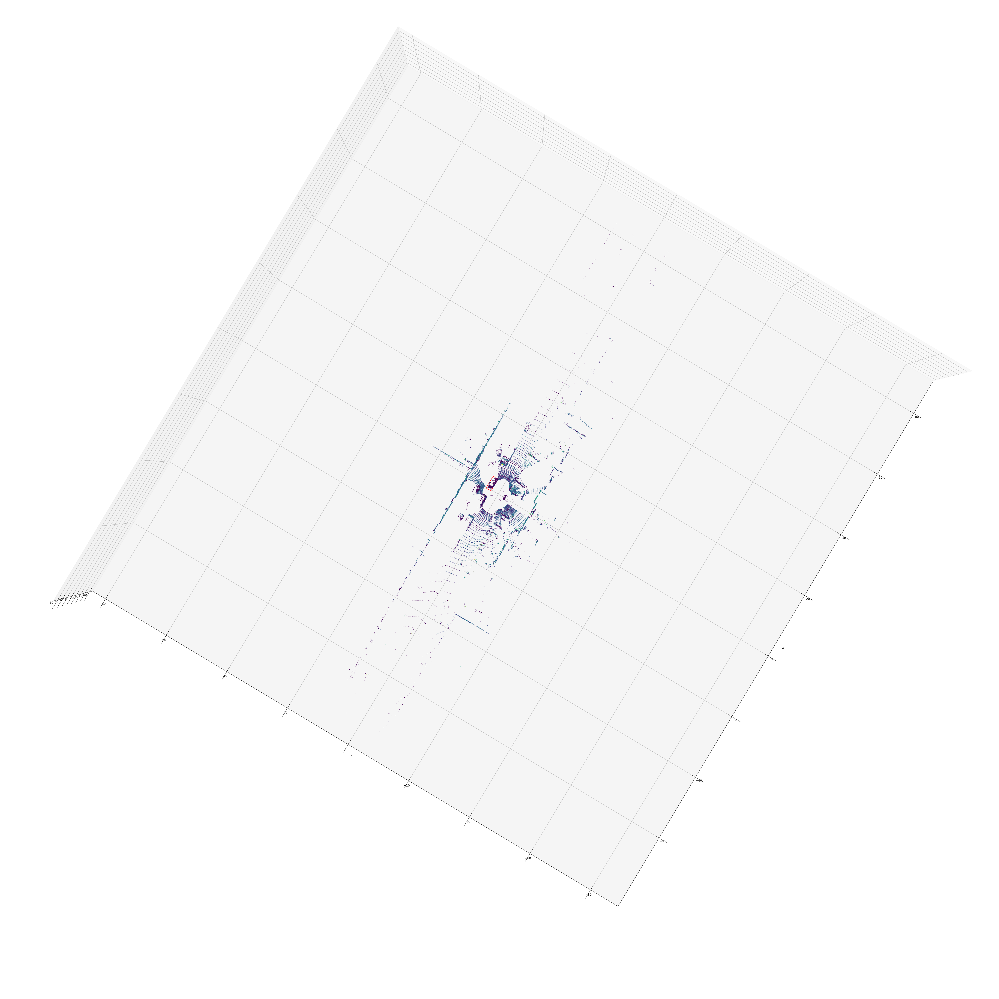

Van
..\..\..\kitti\training\label_2\003206.txt


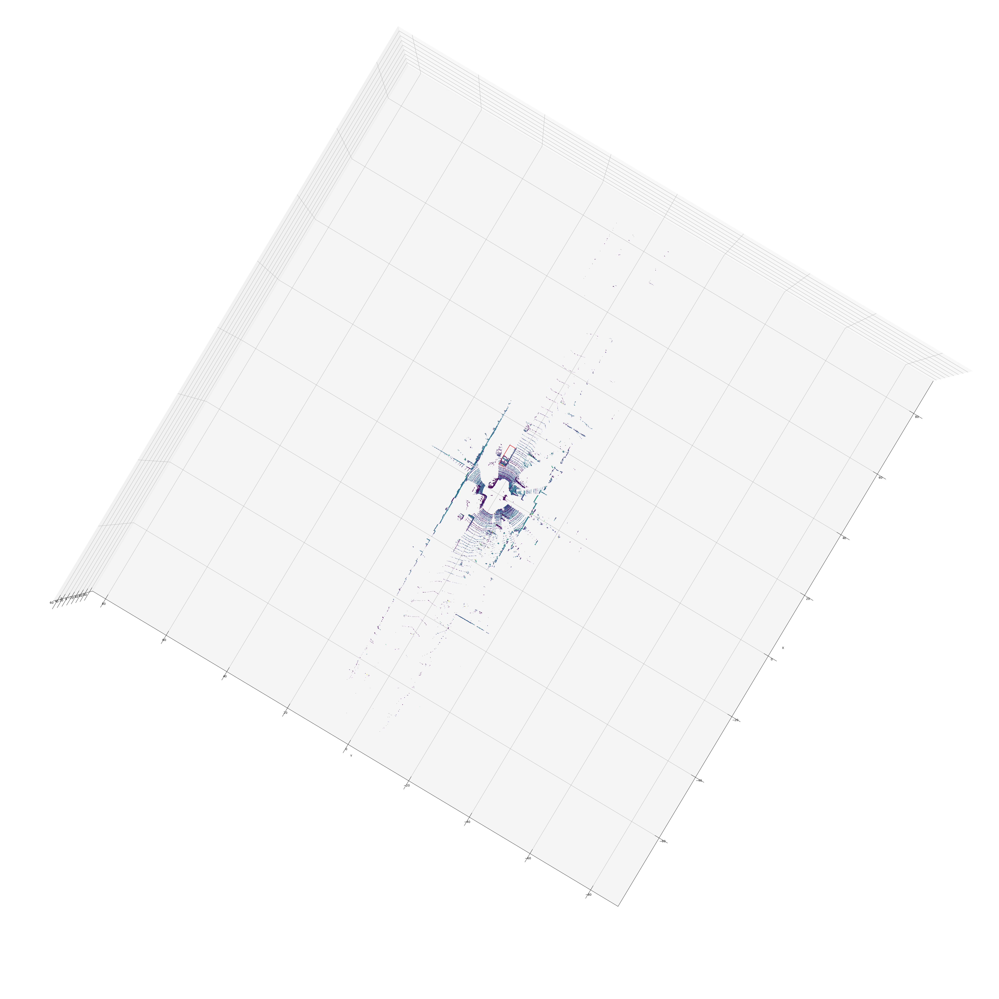

Pedestrian
..\..\..\kitti\training\label_2\003206.txt


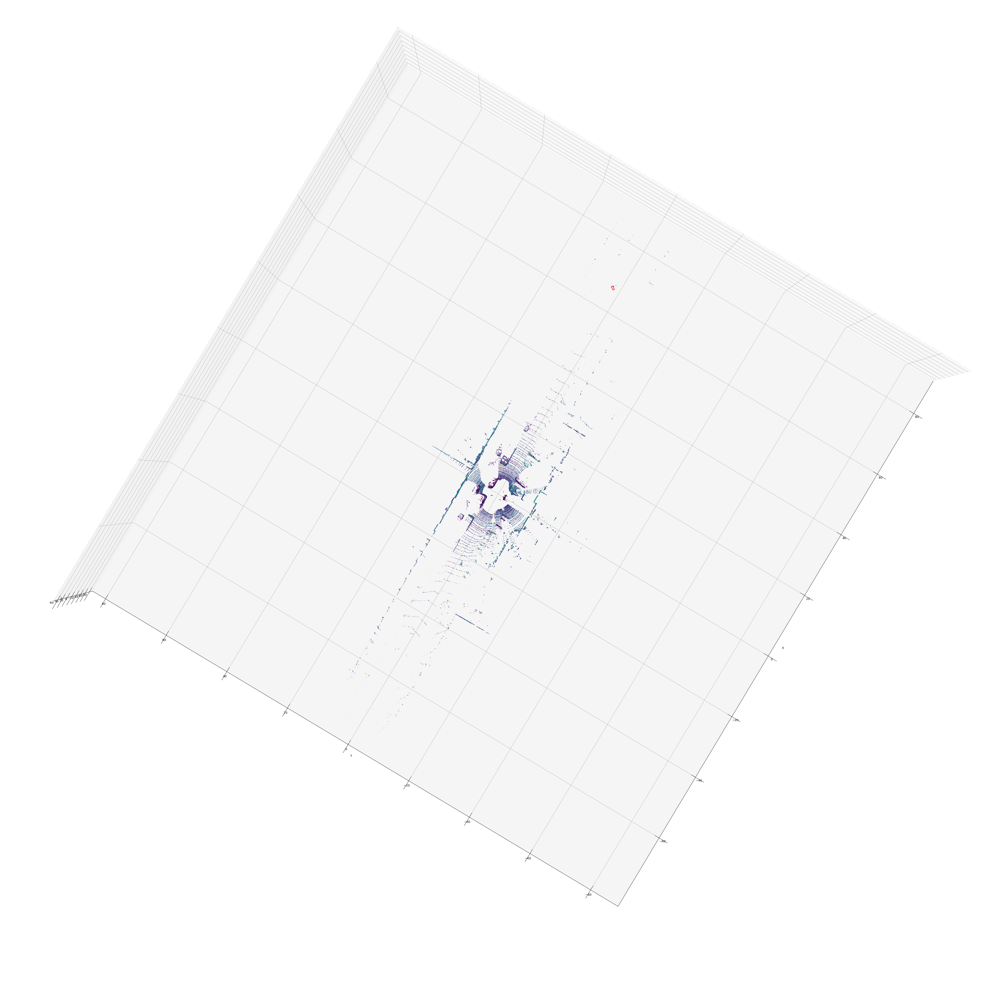

Misc
..\..\..\kitti\training\label_2\005120.txt


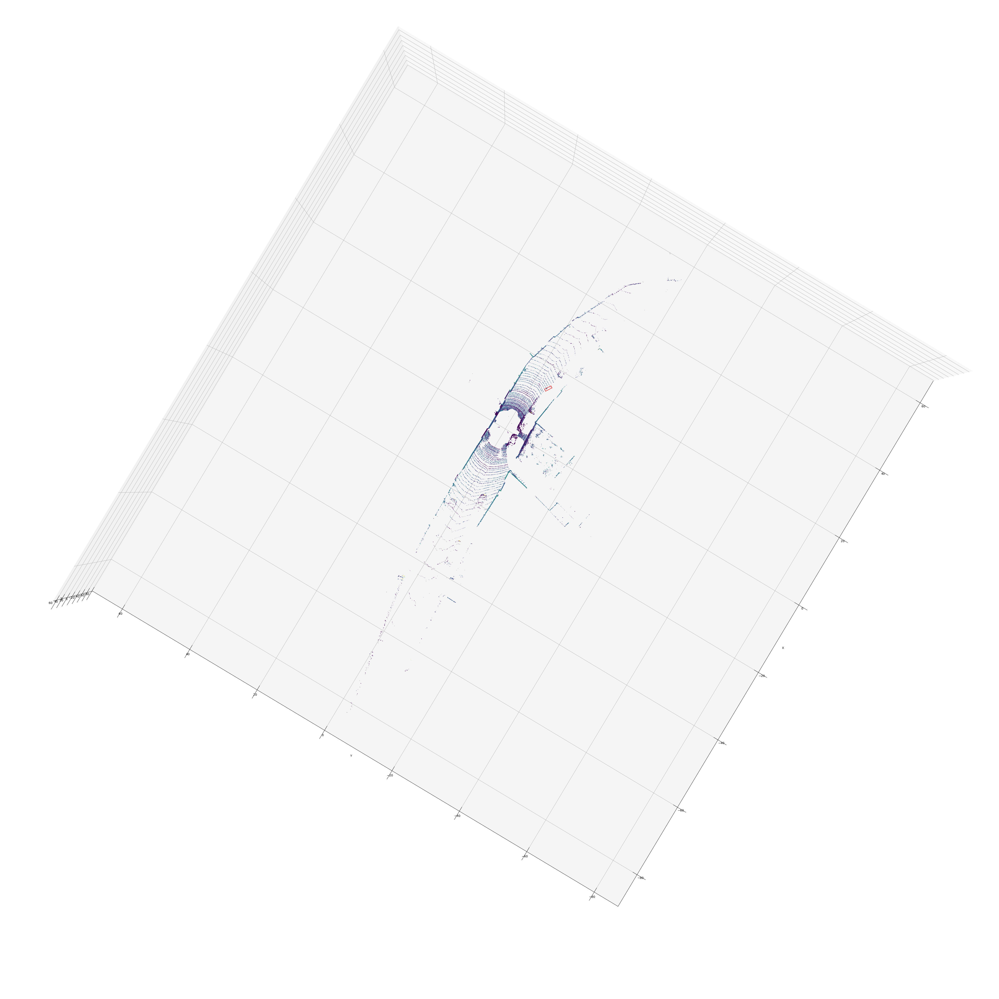

DontCare
..\..\..\kitti\training\label_2\005120.txt


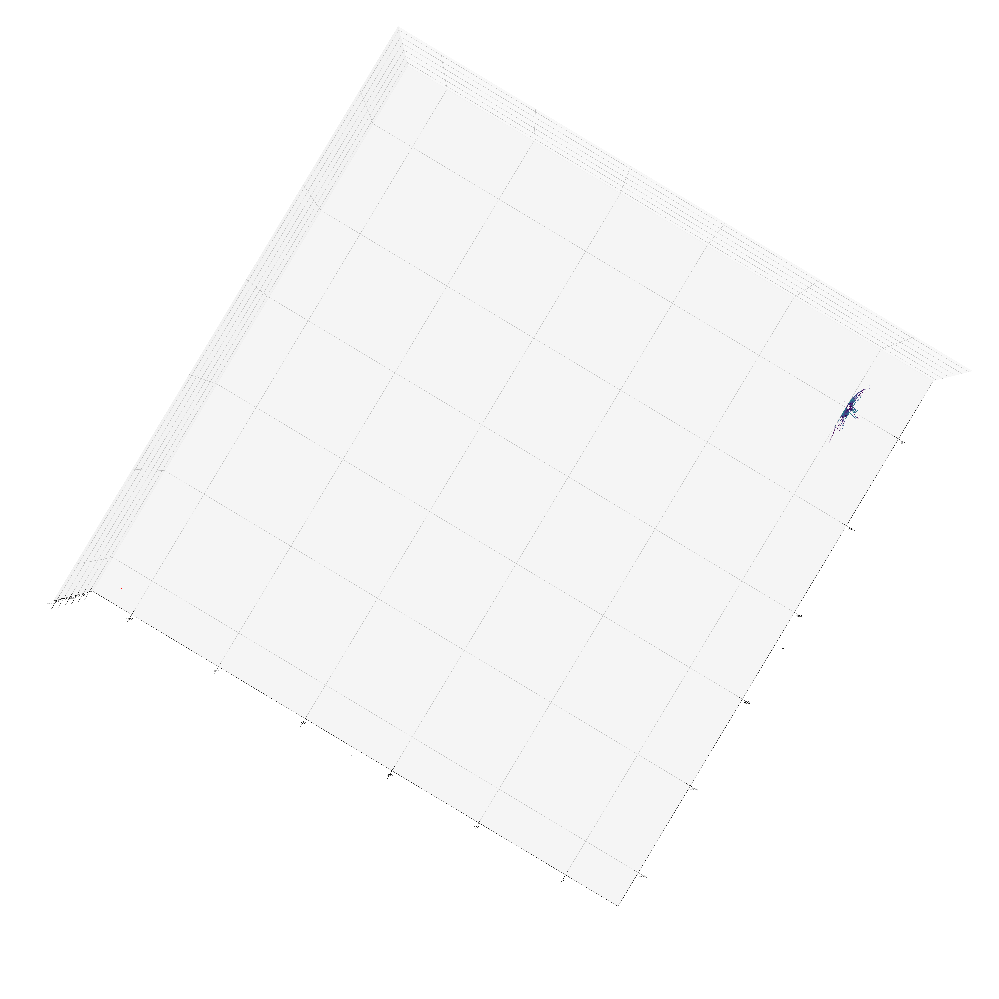

Cyclist
..\..\..\kitti\training\label_2\001692.txt


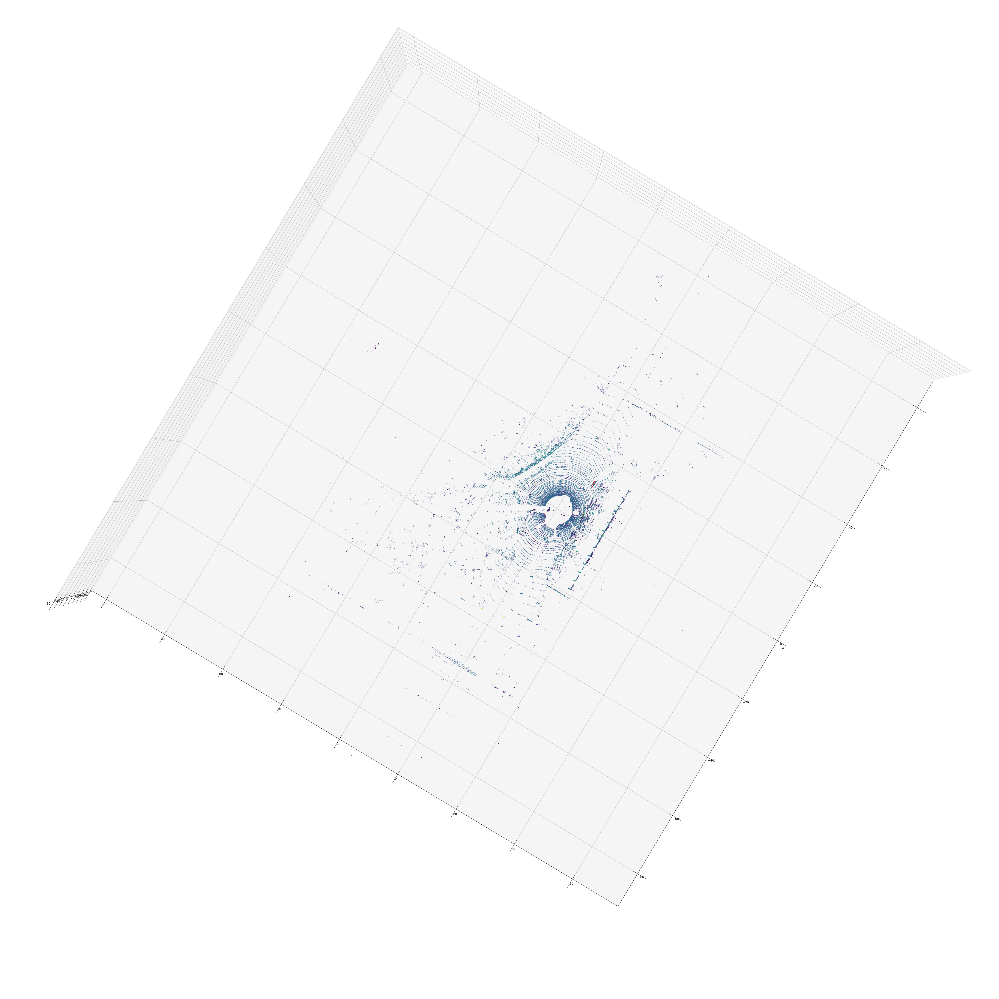

Truck
..\..\..\kitti\training\label_2\006415.txt


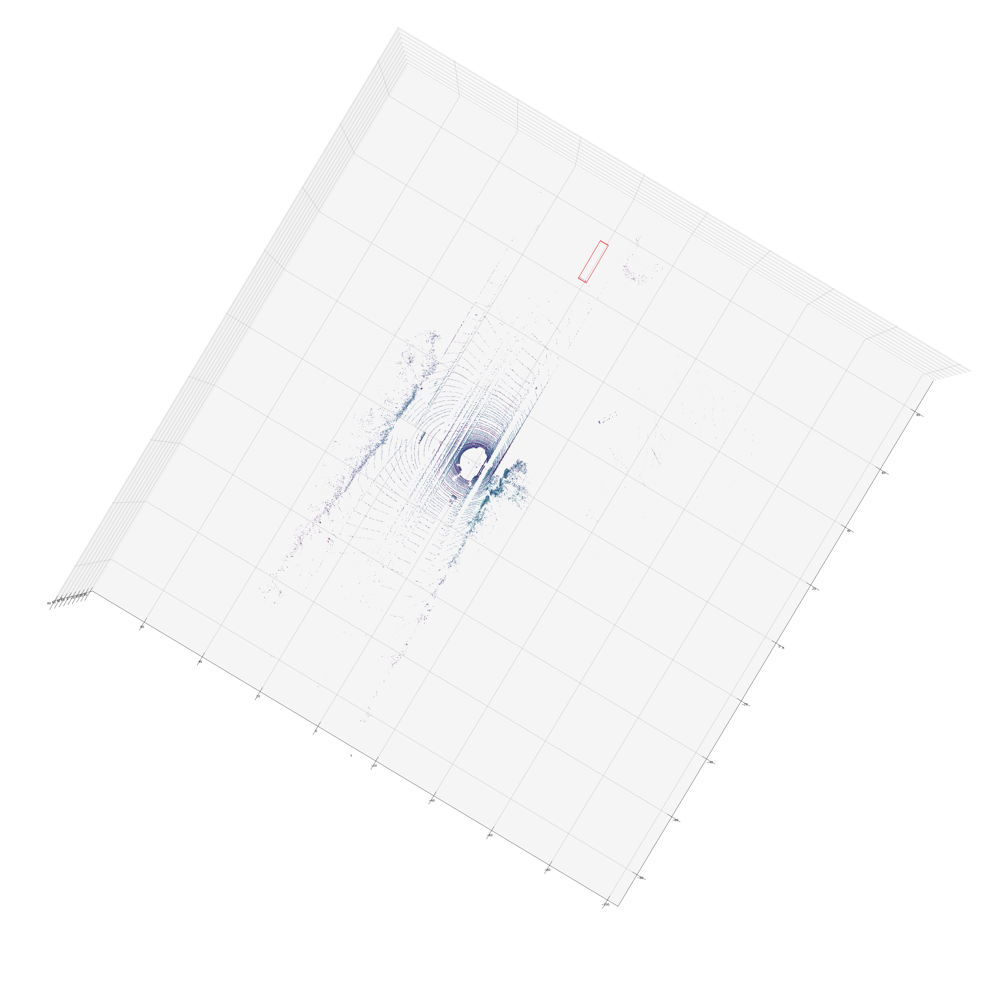

MemoryError: 

In [497]:
for label in object_count.keys():
    print(label)
    # Find the next label file with that label
    label_path = get_file_with_label(label)
    print(label_path)
    # Make scatter plot and save
    # Get corresponding .bin file
    bin_path = str(label_path).replace('label_2', 'velodyne').replace('.txt', '.bin')
    # Get points
    points = np.fromfile(bin_path, dtype=np.float32).reshape(-1, 4)

    # Get the one label of interest
    label_bbox = read_specific_kitti_labels(label_path, label)

    # Drop any points not in that label area
    # filtered_points = roi_filter_points(points, label_bbox)
    # print(len(filtered_points))

    plot_label(label, points, label_bbox)